# Lets cluster these Fingerprints

In this notebook we perform clustering tests on the fingerprint functions. Note that at this point we don't yet have the oxidation state fingerprints and only have those for ones, Z and Chi. We do the clustering with oxidation state fingerprints added in a later notebook. We have the fingerprints and formulae saved in the Pandas DataFrame Fingerprint_lt50_old.csv file.  Note that we only consider compounds where the total number of atoms in the unit cell <50 and for which oxidation number can be calculated. Also note that the struct files are from the materials project which are not always accurate.

##  Loading the CSV into Pandas dataframe and extracting formulae and fingerprints

In [6]:
import pandas as pd
import numpy as np
import tqdm
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

In [7]:
%matplotlib inline

In [8]:
Df=pd.read_csv("../data/FingerPrint_lt50_old.csv",sep='\t',index_col=0)

In [9]:
Df.head()

,Formula,Ones_1,Ones_2,Ones_3,Ones_4,Ones_5,Ones_6,Ones_7,Ones_8,Ones_9,...,Chi_91,Chi_92,Chi_93,Chi_94,Chi_95,Chi_96,Chi_97,Chi_98,Chi_99,Chi_100
0,Nb1 Ag1 O3,-1.0,-1.0,-1.0,-1.000000,-1.00000,-1.000000,-1.000000,-1.000000,-1.000000,...,-0.497277,-0.453894,-0.191895,0.064329,0.104619,-0.118050,-0.394161,-0.537855,-0.587967,-0.654697
1,Li2 Ag6 O4,-1.0,-1.0,-1.0,-1.000000,-1.00000,-1.000000,-1.000000,-1.000000,-0.999999,...,-0.120349,-0.206105,-0.217994,-0.183563,-0.075639,0.073079,0.137550,0.062229,-0.112490,-0.359644
2,Cs2 Ag2 Cl4,-1.0,-1.0,-1.0,-1.000000,-1.00000,-1.000000,-1.000000,-1.000000,-1.000000,...,0.259454,0.218056,0.031980,-0.098497,-0.054451,0.137466,0.285717,0.202032,-0.097068,-0.462973
3,Ag2 Hg1 I4,-1.0,-1.0,-1.0,-1.000000,-1.00000,-1.000000,-1.000000,-1.000000,-1.000000,...,-0.059718,-0.141794,-0.241085,-0.272397,-0.160438,0.054698,0.275458,0.446003,0.474980,0.227803
4,Ag2 C2 O6,-1.0,-1.0,-1.0,-0.999999,-0.99997,-0.999462,-0.993801,-0.954192,-0.782973,...,-0.123078,-0.202793,-0.201147,-0.164696,-0.108094,0.009786,0.153578,0.153906,-0.070010,-0.394319


In [10]:
Formulas=Df["Formula"].values
Formulas

array(['Nb1 Ag1 O3', 'Li2 Ag6 O4', 'Cs2 Ag2 Cl4', ..., 'Y6 Co6 O18',
       'Y1 Co1 F5', 'Mg1 Co4 S8'], dtype=object)

In [11]:
Fingerprints=Df.drop("Formula",axis=1).values

In [12]:
from sklearn.metrics import euclidean_distances

## Testing out Inertia for Kmeans with different n_clusters to see if there is a well defined "elbow" or a sharp drop.

In [13]:
from sklearn.cluster import KMeans

In [15]:
inertia_array=np.zeros(19)
for i in tqdm.tqdm_notebook(range(2,20)):
    Km_run=KMeans(n_clusters=i)
    Km_run.fit_predict(Fingerprints)
    inertia_array[i-2]=Km_run.inertia_

    

In [16]:
inertia_array2=np.zeros(6)
for i in tqdm.tqdm_notebook(range(20,26)):
    Km_run=KMeans(n_clusters=i)
    Km_run.fit_predict(Fingerprints)
    inertia_array2[i-20]=Km_run.inertia_


In [32]:
inertia_array=np.append(inertia_array,inertia_array2)

In [41]:
inertia_array=inertia_array[inertia_array>0]

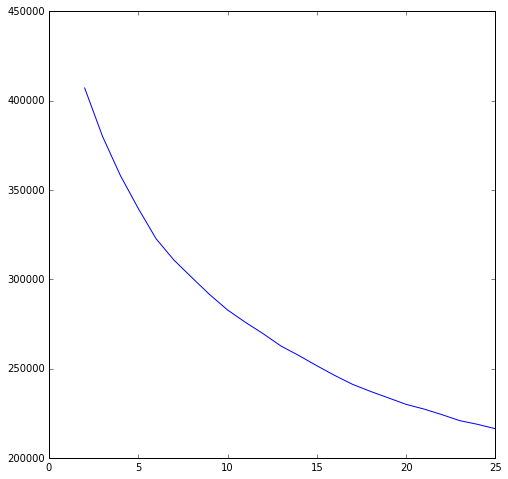

In [42]:
plt.figure(figsize=(8,8))
plt.plot(np.arange(2,26),inertia_array)
plt.ylabel("Inertia")
plt.xlabel("Number of Clusters")

We decide on 15 clusters. There is no real elbow to speak of and we shall see later that 15 gives us fairly tight clusters

## Lets use PCA to make the dataset smaller

We use the explained variance ratio to decide the number of components. We keep 50 components which keeps ~97% of variance

In [8]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
pc=PCA(n_components=50)

In [9]:
pca_fing=pc.fit_transform(Fingerprints)

In [10]:
list(enumerate(np.cumsum(pc.explained_variance_ratio_)))

[(0, 0.16149118125330231),
 (1, 0.27367676124440887),
 (2, 0.37250488053590131),
 (3, 0.44928486557661768),
 (4, 0.50712061537192721),
 (5, 0.54981904927756264),
 (6, 0.5853508611030771),
 (7, 0.6199933456382144),
 (8, 0.65102686933536513),
 (9, 0.68001285644235121),
 (10, 0.70764070985117467),
 (11, 0.73034622458312459),
 (12, 0.7499285382066283),
 (13, 0.76809153805162245),
 (14, 0.78435923367535199),
 (15, 0.79901524025260173),
 (16, 0.81279379573299504),
 (17, 0.82483369075007018),
 (18, 0.83574923304734461),
 (19, 0.84572638458306681),
 (20, 0.8541211132340204),
 (21, 0.86218460989479784),
 (22, 0.86988930772944628),
 (23, 0.87697220787494989),
 (24, 0.88343686872852345),
 (25, 0.88968751572190052),
 (26, 0.89574043598524988),
 (27, 0.90158254950196837),
 (28, 0.90718878573617356),
 (29, 0.91206621481073447),
 (30, 0.91678640751493468),
 (31, 0.92125512084878669),
 (32, 0.92520925187091885),
 (33, 0.92894818633254295),
 (34, 0.93261969138669665),
 (35, 0.93603947790603437),
 (36, 

## Performing KMeans with 15 clusters on these 50-component PCA fingerprints

In [10]:
Km_pca50=KMeans(n_clusters=15,random_state=42)

In [11]:
clusts=Km_pca50.fit_predict(pca_fing)


## Now for some fancy plots!



In [14]:
rst=np.random.RandomState(42)
c_arr=[tuple(rst.uniform(0,1,4)) for i in range(15)]


Plotting the points based on their cluster number as a function of their first 2 PCA components. The labels are the formula of the first compound in the cluster.

In [12]:
labels=[Formulas[clusts==i][0] for i in sorted(set(clusts))]
list(enumerate(labels))

[(0, 'Er2 Ag2 Te4'),
 (1, 'Ag2 Ru2 O8'),
 (2, 'Y2 Ag2 Te4'),
 (3, 'Li2 Ag1 Sb1'),
 (4, 'Ag2 C2 O6'),
 (5, 'Ce2 Ag2 Ge2'),
 (6, 'Li2 Ag6 O4'),
 (7, 'Ag4 Ru4 O12'),
 (8, 'Nb1 Ag1 O3'),
 (9, 'Mn2 Ag2 O6'),
 (10, 'Ag1 Bi1 S2'),
 (11, 'Li1 Ag1 Te1'),
 (12, 'Cs2 Ag2 Cl4'),
 (13, 'Ca2 Ag2 Bi2'),
 (14, 'Rb2 Ag2 O4')]

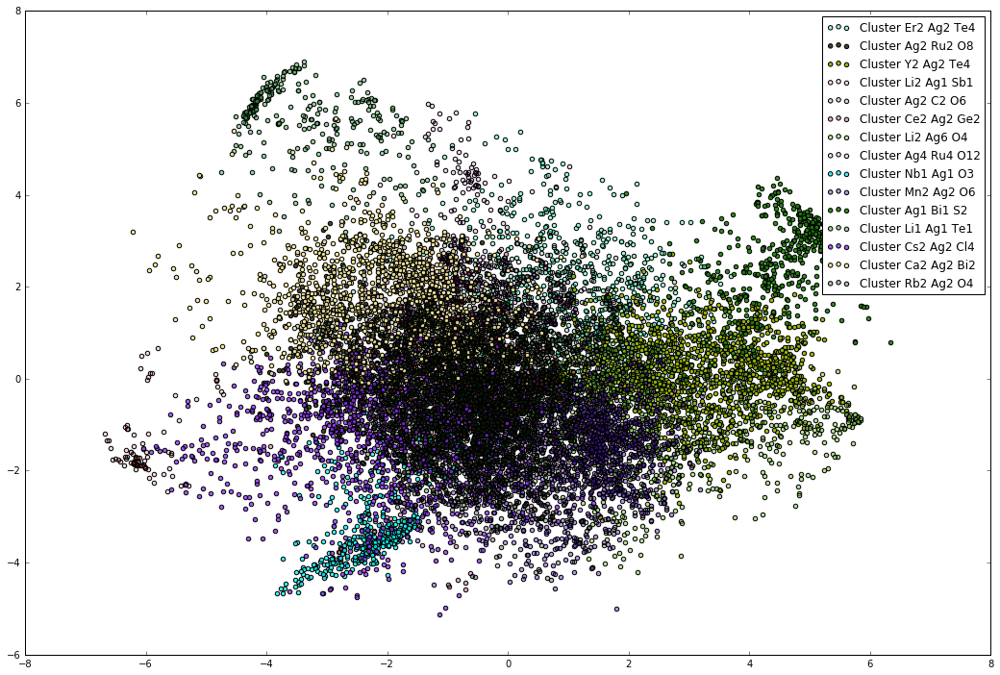

In [15]:
plt.figure(figsize=(18,12))
for i in range(15):
    plt.scatter(pca_fing[clusts==i,0],pca_fing[clusts==i,1],c=c_arr[i],label="Cluster "+labels[i])
plt.legend()

Doing the same thing in 3d for the first 3 PCA components. mplot3d isn't the best tool for 3d plotting due to occlusion effects. Final plots will need to be done with mayavi or something

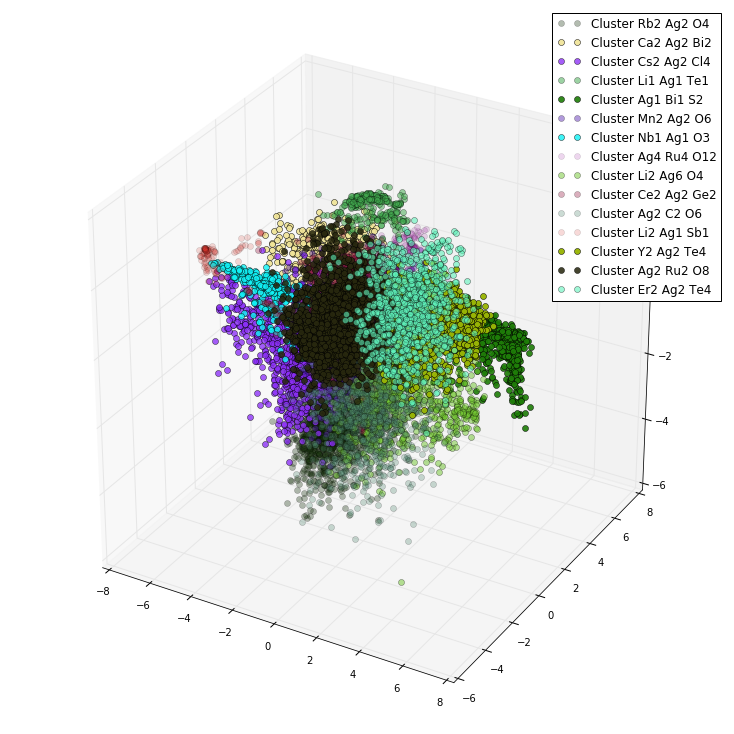

In [17]:
%matplotlib inline
import mpl_toolkits.mplot3d.axes3d as p3
# Plot result
fig = plt.figure(figsize=(10,10))
ax = p3.Axes3D(fig)
#ax.view_init(7, -80)
for i in range(14,-1,-1):
    ax.plot3D(pca_fing[clusts==i,0],pca_fing[clusts==i,1],pca_fing[clusts==i,3],'o',c=c_arr[i],label="Cluster "+labels[i])
#plt.title('Without connectivity constraints (time %.2fs)' % elapsed_time)
plt.legend()

 We have discovered a cluster which seems to contain only perovsklites. We print out the formulas in this cluster ( using Pandas) and see that they are almost exclusively perovskites or very close

In [19]:
Df["cluster_pca50"]=clusts

In [20]:
perov_clust_forms=Df[Df["cluster_pca50"]==Df.ix[0]["cluster_pca50"]]["Formula"]

In [21]:
perov_clust_forms

0          Nb1 Ag1 O3
32          Ag1 B1 O3
33         Zn1 Ag1 F3
86        Cs2 Ag2 Cl6
108       Tl1 Ag1 Cl3
132        Ni1 Ag1 F3
173        Rb1 Ag1 O3
208        Mg1 Ag1 F3
230       Tl2 Ag2 Cl6
231        K2 Ag2 Cl6
240       Tl1 Ag1 Br3
241       Rb1 Ag1 Br3
246        Ta2 Ag2 O6
256        Cu2 Ag2 F6
257        Mg2 Ag2 F6
262        Cu1 Ag1 F3
269        Rb2 Ag2 F6
272        Cs2 Ag2 F6
308        K4 Ag4 F12
332       Cs1 Ag1 Br3
342       Rb1 Ag1 Cl3
343        K1 Ag1 Cl3
407        Al1 Ag1 O3
413         Y1 Ag1 O3
429        Tl1 Ag1 F3
445        K1 Ag1 Br3
485        Sr1 Ag1 O3
504        La1 Al1 O3
505        La2 Al2 O6
512        Al1 Bi1 O3
             ...     
13883    Mn4 Tl4 Cl12
13947     Tl1 Ge1 Cl3
13950     Cs1 Tm1 Cl3
13967     Rb2 In2 Cl6
13968     Tl1 In1 Cl3
14003    Rb6 Mg6 Cl18
14030     Tl1 Cu1 Cl3
14041    Cs9 Hg9 Cl27
14053     Rb1 Sn1 Cl3
14067     Li1 Ti1 Cl3
14075    Rb4 Mg4 Cl12
14103      K1 Ge1 Cl3
14134     Rb1 Pb1 Cl3
14195      K1 Cr1 Cl3
14196     

Since the clusters in Kmeans are arbitrarily ordered, so in order to get pretty similarity matrices, we need to reorder them. We choose to do this based on the distance of cluster center to cluster center of cluster 0. This is not terribly necessary but leads to nicer plots

In [18]:
from collections import Counter
Counter(clusts)

Counter({0: 938,
         1: 1728,
         2: 1507,
         3: 97,
         4: 891,
         5: 777,
         6: 998,
         7: 550,
         8: 491,
         9: 1505,
         10: 492,
         11: 283,
         12: 1204,
         13: 1212,
         14: 2049})

We plot the similarity matrix for the cluster centers before(1st figure) and after (2nd figure) reordering. We see that the second figure much more ordered

In [20]:
dist_centers=euclidean_distances(Km_pca50.cluster_centers_)

[  0.           3.93535105   3.90032104  11.7278847    4.79061938
   4.34218444   4.00873426   4.74158359   7.58895776   4.24982168
   6.47418226   7.54039307   5.19884462   4.48322222   4.32923034]


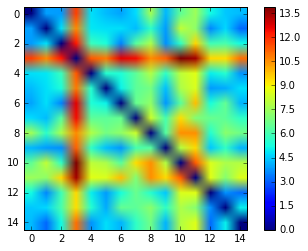

In [21]:
print dist_centers[0]
plt.imshow(dist_centers)
plt.colorbar()

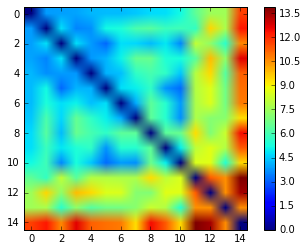

In [22]:
clust_centers=Km_pca50.cluster_centers_
sort_args=[np.argwhere(dist_centers[0]==i )[0][0] for i in np.sort(dist_centers[0])]
centers_sorted=clust_centers[[np.argwhere(dist_centers[0]==i )[0][0] for i in np.sort(dist_centers[0])]]
plt.imshow(euclidean_distances(centers_sorted))
plt.colorbar()

We now resort the fingerprints based on these renamed cluster labels using pandas sort. We shall use these to plot similarity matrices which shall look more ordered 

In [23]:
sort_args

[0, 2, 1, 6, 9, 14, 5, 13, 7, 4, 12, 10, 11, 8, 3]

In [24]:
clusts_sorted=np.zeros(len(clusts),dtype=int)
for i in range(15):
    clusts_sorted[clusts==i]=sort_args.index(i)
    
    

In [25]:
Df["cluster_pca50"]=clusts_sorted
Df_sorted=Df.sort_values(by="cluster_pca50")
clust_sort=Df_sorted["cluster_pca50"].values
fing_sort=Df_sorted.drop(["cluster_pca50","Formula"],axis=1).values

In [26]:
Counter(clust_sort)

Counter({0: 938,
         1: 1507,
         2: 1728,
         3: 998,
         4: 1505,
         5: 2049,
         6: 777,
         7: 1212,
         8: 550,
         9: 891,
         10: 1204,
         11: 492,
         12: 283,
         13: 491,
         14: 97})

We compute the euclidean distance between these fingerprints and store this distance matrix.As the dataset is large, we plot the whole similarity matrix in 2 seperate parts as shown below. We also plot the whole similarity matrix but after taking only every second row/column

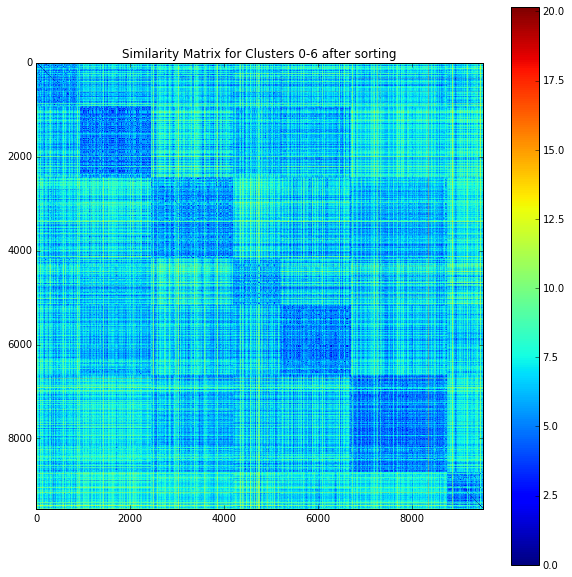

In [29]:
fing_06=fing_sort[clust_sort<7]

dist_06=euclidean_distances(fing_06)

plt.figure(figsize=(10,10))
plt.title("Similarity Matrix for Clusters 0-6 after sorting")
plt.imshow(dist_06)
plt.colorbar()



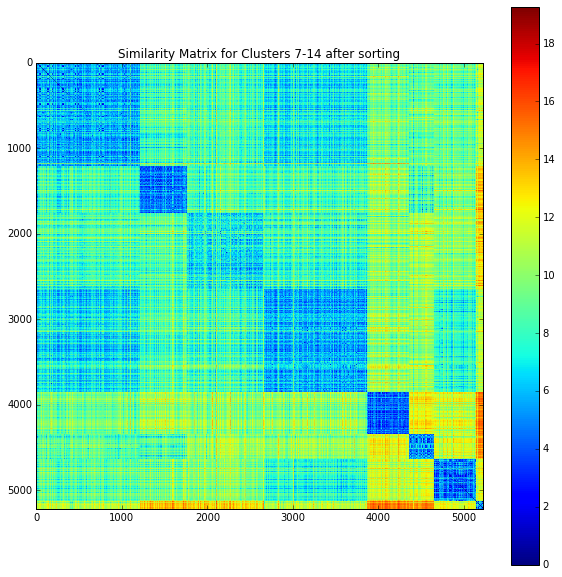

In [30]:
fing_714=fing_sort[clust_sort>6]

dist_714=euclidean_distances(fing_714)

plt.figure(figsize=(10,10))
plt.imshow(dist_714,cmap=plt.)
plt.title("Similarity Matrix for Clusters 7-14 after sorting")
plt.colorbar()

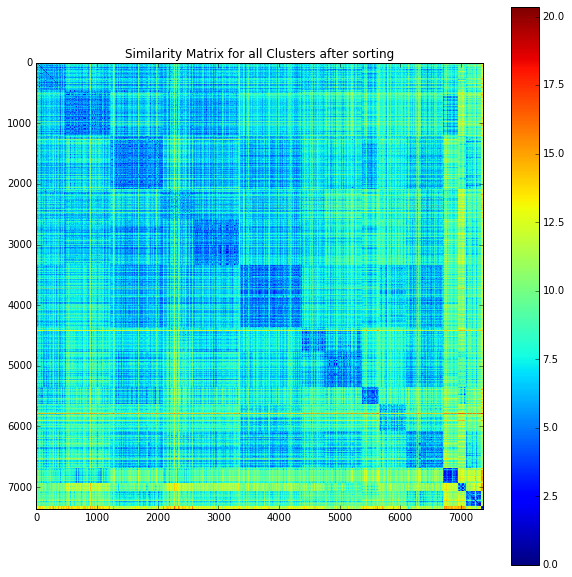

In [37]:
dist_014=euclidean_distances(fing_sort)
plt.figure(figsize=(10,10))
plt.imshow(dist_014[::2,::2])
plt.title("Similarity Matrix for all Clusters after sorting")
plt.colorbar()

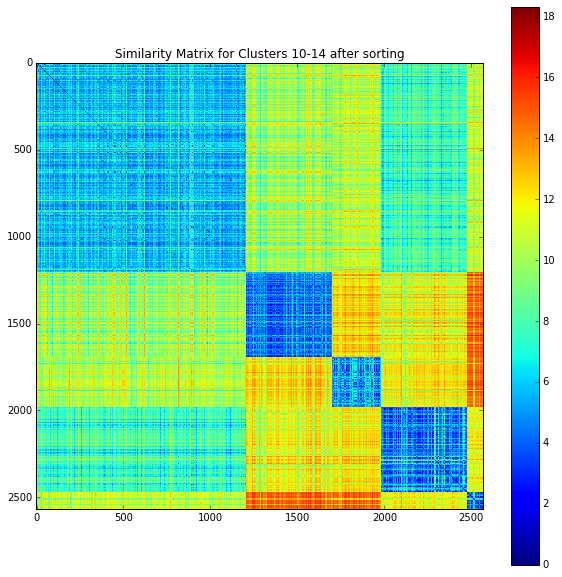

In [31]:
fing_914=fing_sort[clust_sort>9]

dist_914=euclidean_distances(fing_914)

plt.figure(figsize=(10,10))
plt.title("Similarity Matrix for Clusters 10-14 after sorting")
plt.imshow(dist_914)
plt.colorbar()

We see that the last few clusters are very tight whereas the first few clusters, not so much. We probably need more clusters or these structures might be hard to seperate using Kmeans

# Lets match results with Agglomerative clustering (Incredibly slow)

Tried Agglomerative clustering. However it is ridiculously slow and not usable even when reducing the number of PCA components

In [39]:
from sklearn.cluster import AgglomerativeClustering


In [40]:
Ag=AgglomerativeClustering(n_clusters=15)


In [42]:
pc2=PCA(n_components=10)
pca_fing_sort10=pc2.fit_transform(fing_sort)

In [47]:
import os

In [ ]:
clust_ag=Ag.fit_predict(pca_fing_sort40)

os.system('say "your program has finished"')

In [48]:
Counter(clust_ag)

Counter({0: 585,
         1: 463,
         2: 425,
         3: 516,
         4: 470,
         5: 253,
         6: 234,
         7: 512,
         8: 143,
         9: 262,
         10: 263,
         11: 159,
         12: 292,
         13: 185,
         14: 238})

# Lets refactor these structures into the periodic table

Now lets get onto the fun part. We shall create a new array refactor_array of dimensions 92x92x92x15, 92 being the number of elements in our dataset. Each elements [a,b,c,d] shall contain the number of structures having elements with atomic numbers (a,b,c) and in cluster D. This will allow is where in the periodic table all of these clusters lie

In [27]:
from pymatgen import Composition

In [28]:
Formulas_s=Df_sorted["Formula"].values

clusters_s=Df_sorted["cluster_pca50"].values

Comps_s=[Composition(i) for i in Formulas_s]

Z_max=max([ E.Z for comp in Comps_s for E in comp.elements ])

Z_array= np.array([[E.Z for E in comp.elements] for comp in Comps_s ])

In [113]:
Z_array.shape

(14722, 3)

Note that the way I have set it up, the refactor array is 6 times degenerate as all permutations of (a,b,c) (the first three indices) have the same values stored

In [33]:
from itertools import permutations

In [402]:
refactor_array=np.zeros((Z_max,Z_max,Z_max,np.amax(clusters_s)+1))
for i in tqdm.tqdm_notebook(range(len(clusters_s))):
    for index in set(permutations(Z_array[i])):
        refactor_array[index[0]-1,index[1]-1,index[2]-1][clusters_s[i]]+=1
    

In [362]:
Counter(clusters_s)

Counter({0: 938,
         1: 1507,
         2: 1728,
         3: 998,
         4: 1505,
         5: 2049,
         6: 777,
         7: 1212,
         8: 550,
         9: 891,
         10: 1204,
         11: 492,
         12: 283,
         13: 491,
         14: 97})

In [403]:
refactor_summed=np.sum(refactor_array,axis=3)

In [63]:
refactor_summed[7].shape

(92, 92)

In [404]:
count=0
xarr=np.zeros(8464)
yarr=np.zeros(8464)
zarr=np.zeros(8464)
for (a,b),c in np.ndenumerate(refactor_summed[7]):
    if c>0:
        xarr[count]=a+1
        yarr[count]=b+1
        zarr[count]=c
        count=count+1

## Plotting Barplots for all the Oxides ternaries as a function of atomic numbers

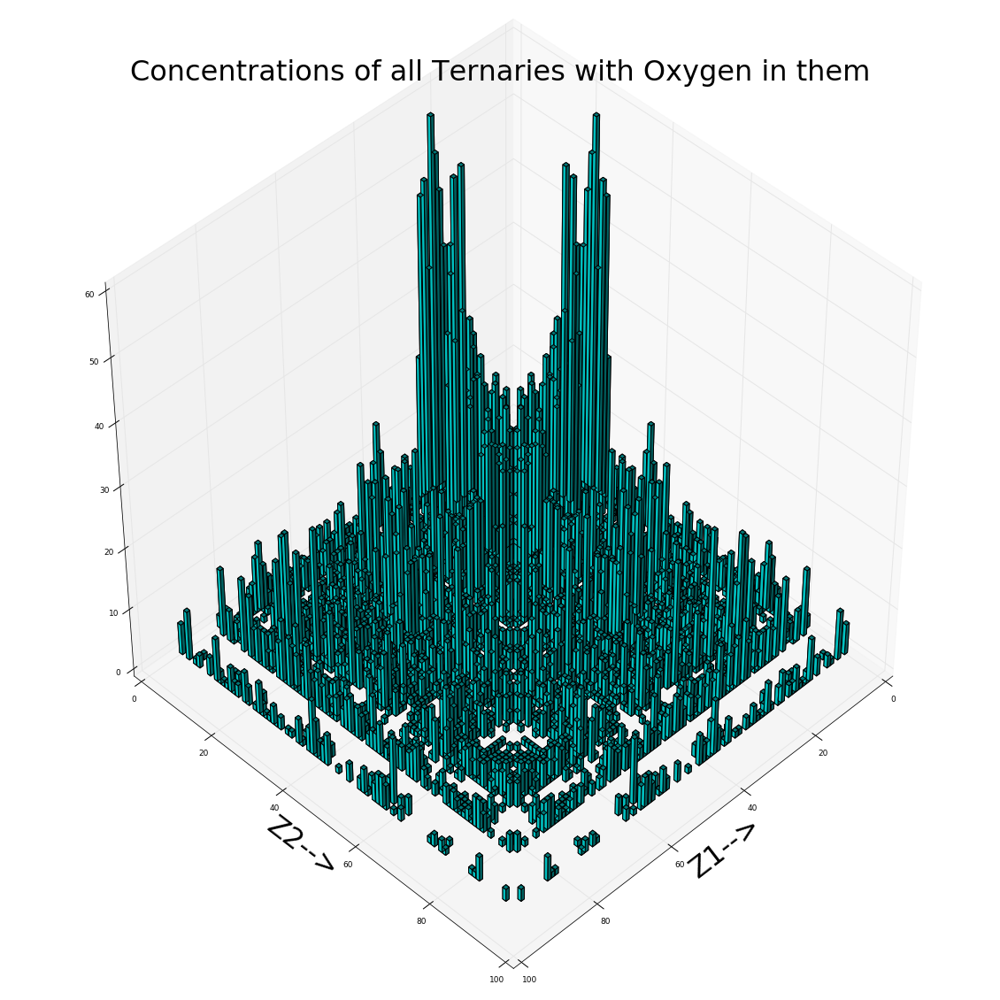

In [405]:
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(45, 45)
ax.bar3d(xarr[0:count], yarr[0:count],np.zeros(count),0.85,0.85,zarr[0:count], color='c', zsort='average')
plt.title("Concentrations of all Ternaries with Oxygen in them",fontsize=32)
plt.xlabel("Z1-->",fontsize=32)
plt.ylabel("Z2-->",fontsize=32)

## We now write up new code to create stacked barplots for all oxide ternaries where the different colors denote different clusters.

In [406]:
np.random.seed(13)
c2_arr=np.random.rand(15,4)
count=0
count8=0
xarr=np.zeros(8464)
yarr=np.zeros(8464)
zarr=np.zeros(8464)
dzarr=np.zeros(8464)
clust_arr=np.zeros((8464,4))
label_arr=np.zeros(8464)
Z_tag=7
for (a,b,c),d in np.ndenumerate(refactor_array[Z_tag]):
    if d>0:
        if c==8:
            count8=count8+1
        xarr[count]=a+1
        yarr[count]=b+1
        zarr[count]=np.sum(refactor_array[Z_tag,a,b,0:c])
        clust_arr[count]=c2_arr[c]
        label_arr[count]=c
        dzarr[count]=d
        count=count+1
xarr=xarr[0:count]
yarr=yarr[0:count]
zarr=zarr[0:count]
dzarr=dzarr[0:count]
clust_arr=clust_arr[0:count]
label_arr=label_arr[0:count]
print count


7800


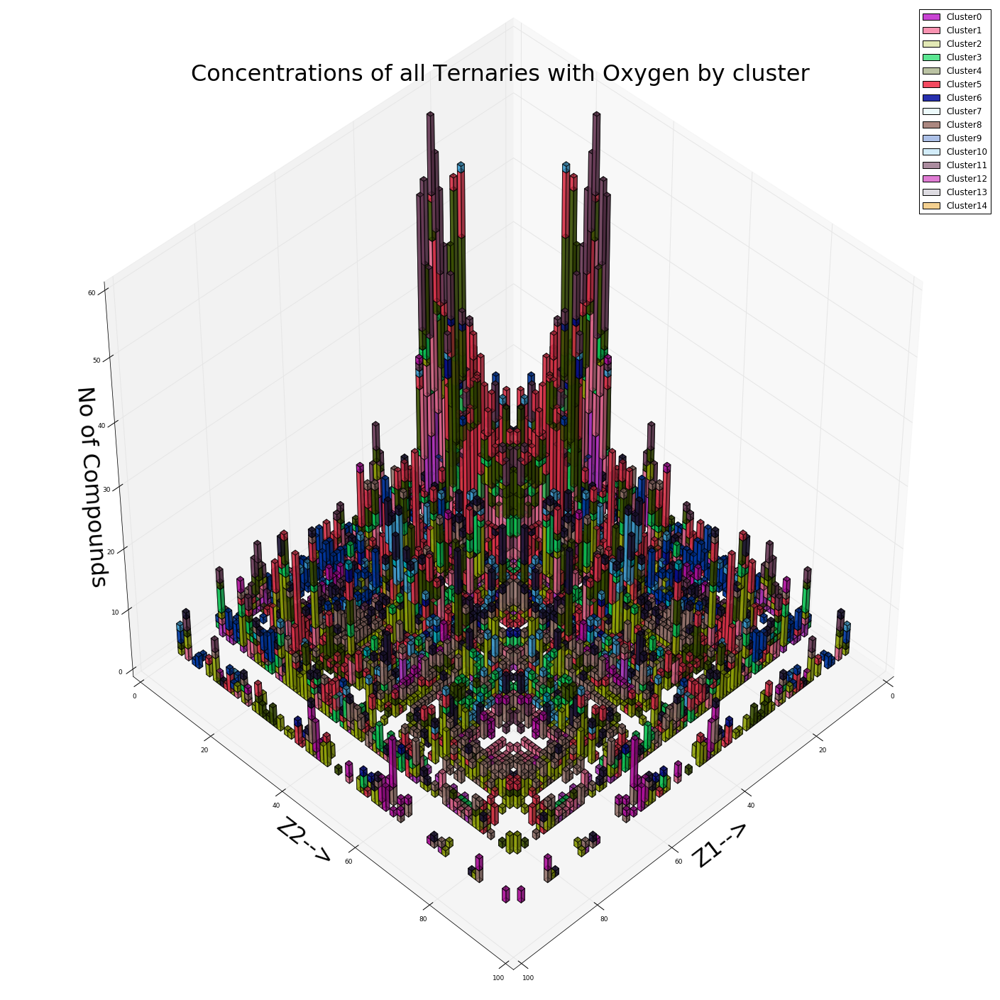

In [407]:
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline
fig = plt.figure(figsize=(25,25))

ax = fig.add_subplot(111, projection='3d')
ax.view_init(45, 45)
ax.bar3d(xarr, yarr,zarr,0.95,0.95,dzarr,color=clust_arr,zsort='average',alpha=0.7)
plt.title("Concentrations of all Ternaries with Oxygen by cluster",fontsize=32)
ax.set_xlabel("Z1-->",fontsize=32)
ax.set_ylabel("Z2-->",fontsize=32)
ax.set_zlabel("No of Compounds",fontsize=32)
proxies=[plt.Rectangle((0,0),2,2,fc=c2_arr[i]) for i in range(15)]
names=["Cluster"+str(i) for i in range(15)]
ax.legend(proxies,names)

##  barplot for all oxide ternaries which belong to the perovskite cluster

In [410]:
np.random.seed(13)
c2_arr=np.random.rand(15,4)
count=0
xarr=np.zeros(8464)
yarr=np.zeros(8464)
zarr=np.zeros(8464)
dzarr=np.zeros(8464)
clust_arr=np.zeros((8464,4))
label_arr=np.zeros(8464)
Z_tag=7
for (a,b,c),d in np.ndenumerate(refactor_array[Z_tag]):
    if d>0 and c==13:
        xarr[count]=a+1
        yarr[count]=b+1
        clust_arr[count]=c2_arr[c]
        label_arr[count]=c
        dzarr[count]=d
        count=count+1
xarr=xarr[0:count]
yarr=yarr[0:count]
zarr=zarr[0:count]
dzarr=dzarr[0:count]
clust_arr=clust_arr[0:count]
label_arr=label_arr[0:count]


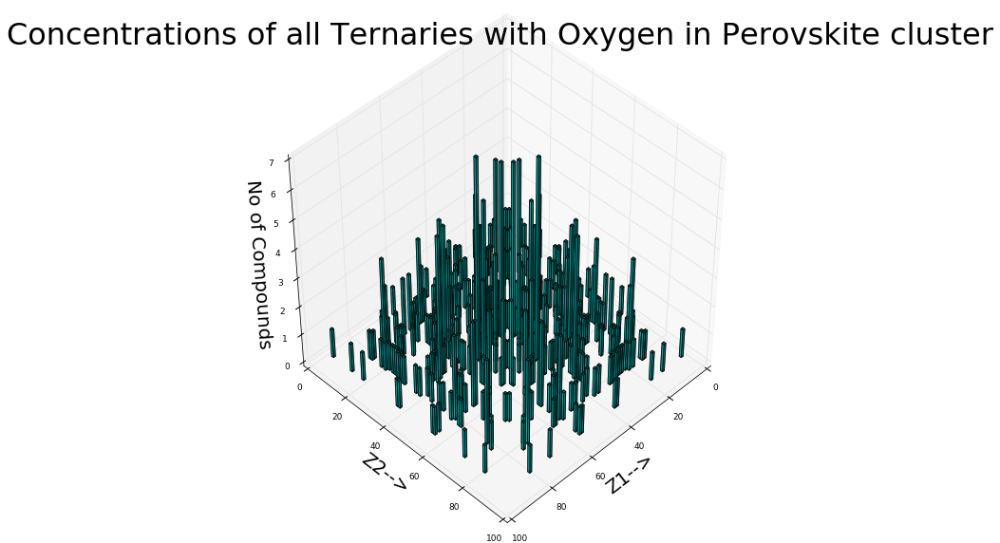

In [411]:
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(45, 45)
ax.bar3d(xarr, yarr,zarr,0.95,0.95,dzarr,color='c',zsort='average',alpha=0.7)
plt.title("Concentrations of all Ternaries with Oxygen in Perovskite cluster",fontsize=32)
ax.set_xlabel("Z1-->",fontsize=20)
ax.set_ylabel("Z2-->",fontsize=20)
ax.set_zlabel("No of Compounds",fontsize=20)

 We should probably plot only one half of all these graphs as the thing is symmetric about the diagonal

In [412]:
labels=[Formulas_s[clusters_s==i][0] for i in range(np.amax(clusters_s)+1)]
list(enumerate(labels))

[(0, 'Li16 Fe2 S12'),
 (1, 'Sm4 Tm4 O12'),
 (2, 'Hg8 O2 F12'),
 (3, 'Mn1 In2 Te4'),
 (4, 'Na8 Ge8 Se20'),
 (5, 'Cs12 Bi8 O18'),
 (6, 'Ho1 Ge2 Rh2'),
 (7, 'Sm8 Ag4 Se14'),
 (8, 'Yb6 Mn6 O18'),
 (9, 'Sn2 C4 O8'),
 (10, 'K12 Ge4 Te12'),
 (11, 'Ba6 Zr1 O8'),
 (12, 'Nd2 O2 F2'),
 (13, 'K1 Ag1 Cl3'),
 (14, 'Si1 Hg1 P2')]

We write new code to plot stacked barplots for only a subset of all the clusters. Note that all of these code as well as the code required to plot the scatterplots found later have now been put in fingerprint_refactoring.py in the src folder

In [413]:
np.random.seed(45)
c2_arr=np.random.rand(15,4)

In [416]:
def get_barplot_arrays(ref_array,Z_tag,list_clusts):
    count=0
    xarr=np.zeros(8464)
    yarr=np.zeros(8464)
    zarr=np.zeros(8464)
    dzarr=np.zeros(8464)
    clust_arr=np.zeros((8464,4))
    #label_arr=np.zeros(8464)
    Z=Z_tag-1
    refactor_block=(ref_array[Z])[:,:,list_clusts]
    for (a,b,c),d in np.ndenumerate(refactor_block):
        if (d>0 and b>=a):
            xarr[count]=a+1
            yarr[count]=b+1
            zarr[count]=np.sum(refactor_block[a,b,0:c])
            clust_arr[count]=c2_arr[list_clusts[c]]
            dzarr[count]=d
            count=count+1
    xarr=xarr[0:count]
    yarr=yarr[0:count]
    zarr=zarr[0:count]
    dzarr=dzarr[0:count]
    clust_arr=clust_arr[0:count]
    #label_arr=label_arr[0:count]
    return (xarr,yarr,zarr,dzarr,clust_arr)

In [379]:
refactor_array.shape

(92, 92, 92, 15)

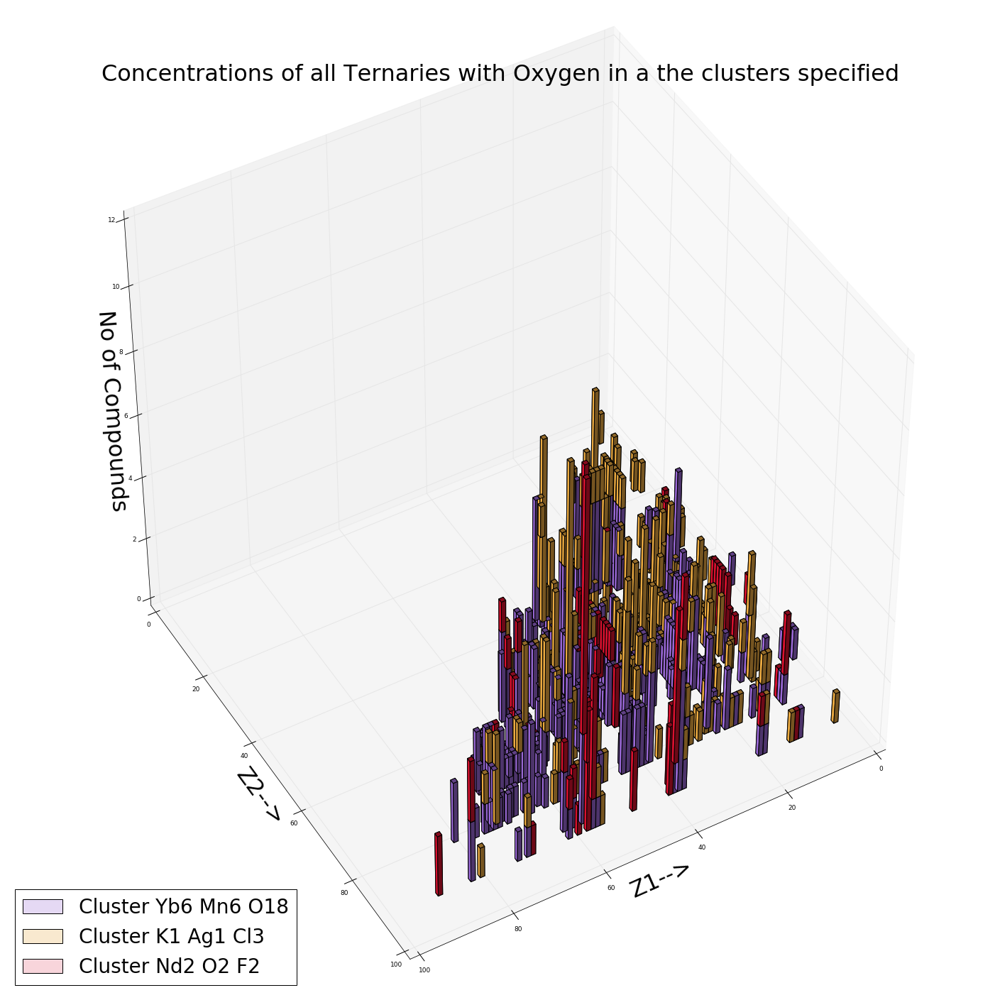

In [417]:
%matplotlib inline

l_clust=[8,13,12]

(xarr,yarr,zarr,dzarr,clust_arr)=get_barplot_arrays(refactor_array,8,l_clust)


fig = plt.figure(figsize=(25,25))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(45, 60)

ax.bar3d(xarr, yarr,zarr,0.95,0.95,dzarr,color=clust_arr,zsort='average',alpha=1.0)
plt.title("Concentrations of all Ternaries with Oxygen in a the clusters specified",fontsize=32)
ax.set_xlabel("Z1-->",fontsize=32)
ax.set_ylabel("Z2-->",fontsize=32)
ax.set_zlabel("No of Compounds",fontsize=32)
proxies=[plt.Rectangle((0,0),2,2,fc=c2_arr[i]) for i in l_clust]
names=["Cluster "+labels[i] for i in l_clust]
ax.legend(proxies,names,fontsize=28,loc=3)

Rejigging code to only plot one half of these bar plots


In [418]:
def get_barplot_summed(ref_summed,Z_tag):
    count=0
    xarr=np.zeros(8464)
    yarr=np.zeros(8464)
    zarr=np.zeros(8464)
    dzarr=np.zeros(8464)
    clust_arr=np.zeros((8464,4))
    for (a,b),d in np.ndenumerate(ref_summed[Z_tag-1]):
        if (d>0 and b>=a):
            xarr[count]=a+1
            yarr[count]=b+1
            dzarr[count]=d
            count=count+1
    xarr=xarr[0:count]
    yarr=yarr[0:count]
    zarr=zarr[0:count]
    dzarr=dzarr[0:count]
    return (xarr,yarr,zarr,dzarr)

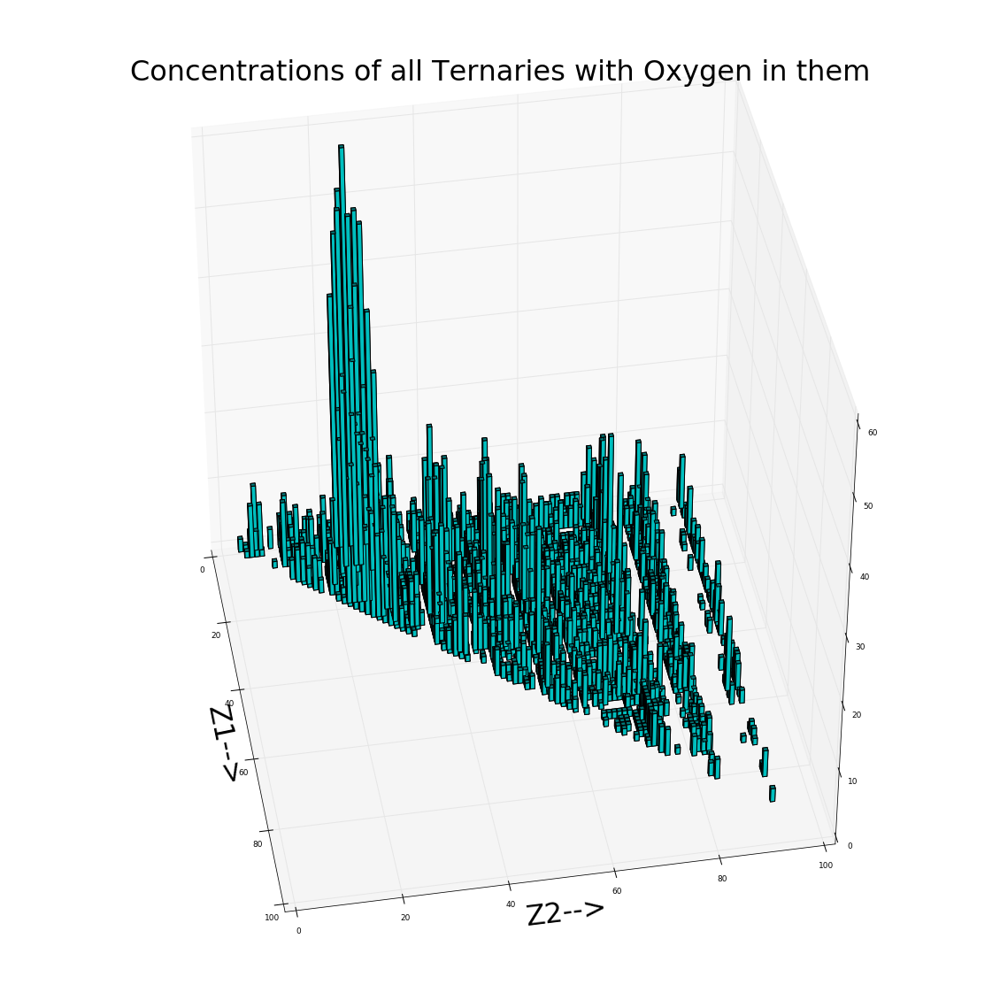

In [419]:

from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline
xarr,yarr,zarr,dzarr=get_barplot_summed(refactor_summed,8)
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(40,-10)
ax.bar3d(xarr, yarr,zarr,0.85,0.85,dzarr, color='c', zsort='average')
plt.title("Concentrations of all Ternaries with Oxygen in them",fontsize=32)
plt.xlabel("Z1-->",fontsize=32)
plt.ylabel("Z2-->",fontsize=32)

# Lets create Heat maps

We know plot heatmaps using scatter plot. These could also have been done using imshow but that has too much postprocessing and interpolation and is also slower. Note that the colorbars in all the scatterplts have been shortened in range so as to show more detail in the plots

In [420]:
def get_scatterplot_summed(ref_summed,Z_tag):
    count=0
    xarr=np.zeros(8464)
    yarr=np.zeros(8464)
    zarr=np.zeros(8464)
    dzarr=np.zeros(8464)
    clust_arr=np.zeros((8464,4))
    for (a,b),d in np.ndenumerate(ref_summed[Z_tag-1]):
        if d>0:
            xarr[count]=a+1
            yarr[count]=b+1
            dzarr[count]=d
            count=count+1
    xarr=xarr[0:count]
    yarr=yarr[0:count]
    zarr=zarr[0:count]
    dzarr=dzarr[0:count]
    return (xarr,yarr,zarr,dzarr)

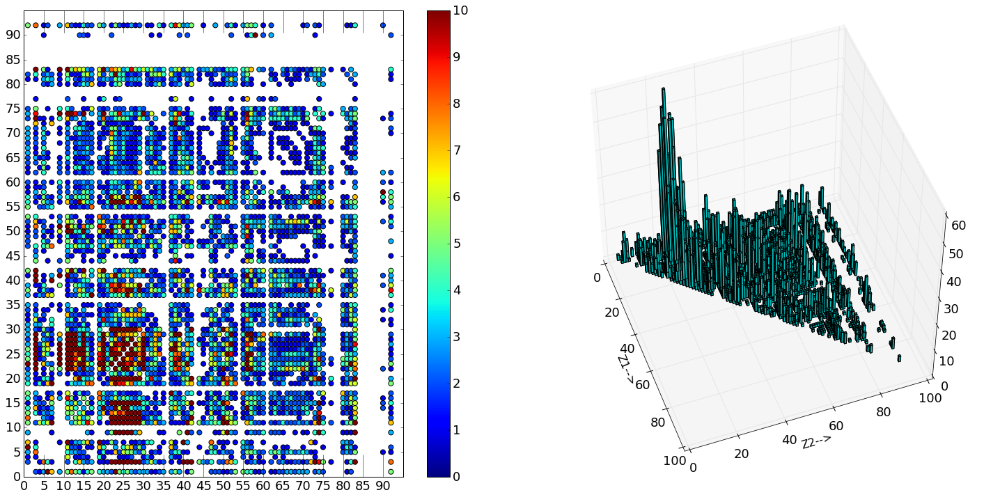

In [421]:
%matplotlib inline
plt.rcParams["figure.subplot.wspace"]=0.05  
plt.rcParams["xtick.labelsize"]=18  
plt.rcParams["ytick.labelsize"]=18  
plt.figure(figsize=(25,12))
plt.subplot(1,2,1)
xarr,yarr,zarr,dzarr=get_scatterplot_summed(refactor_summed,8)
plt.scatter(xarr,yarr,c=dzarr,s=50)
plt.xlim([0,95])
plt.ylim([0,95])
plt.gca().set_xticks(np.arange(0,95,5))
plt.gca().set_yticks(np.arange(0,95,5))
plt.clim(0,10)
plt.colorbar()
xarr,yarr,zarr,dzarr=get_barplot_summed(refactor_summed,8)
ax = plt.subplot(1,2,2, projection='3d')
ax.view_init(50,-20)
ax.bar3d(xarr, yarr,zarr,0.85,0.85,dzarr, color='c', zsort='average')
ax.set_ylabel("Z2-->",fontsize=16)
ax.set_xlabel("Z1-->",fontsize=16)

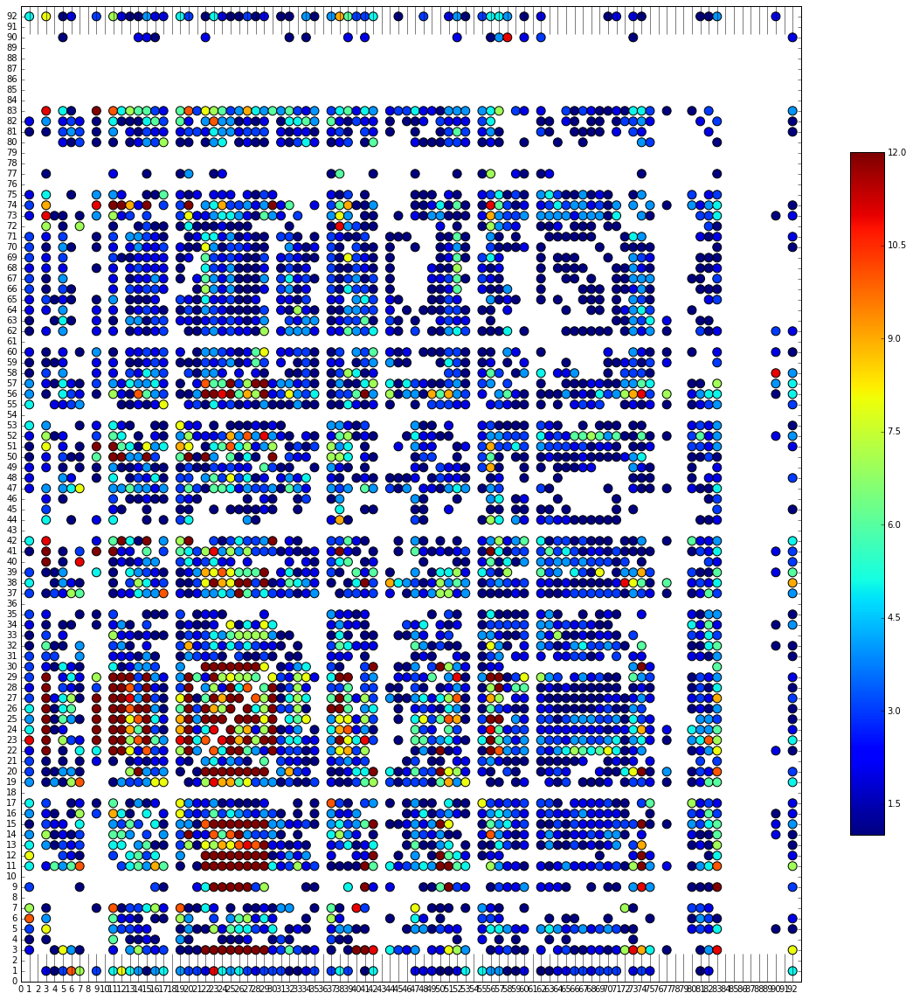

In [422]:
plt.rcParams["xtick.labelsize"]=10  
plt.rcParams["ytick.labelsize"]=10  
plt.figure(figsize=(20,20))
xarr,yarr,zarr,dzarr=get_scatterplot_summed(refactor_summed,8)
plt.scatter(xarr[dzarr>0],yarr[dzarr>0],c=dzarr[dzarr>0],s=100)
plt.xlim([0,93])
plt.ylim([0,93])
plt.gca().set_xticks(np.arange(0,93,1))
plt.gca().set_yticks(np.arange(0,93,1))
plt.clim(1,12)
plt.colorbar(shrink=0.7)

## Refactoring the Periodic Table
Instead of using just the atomic number as the index, let us regroup the rows and columns into representative blocks such as Group1,Group2 , Group3, electronegative P block, D-block and F-block elements and then relabel the x and y axis by the chemical symbol of the elements

In [389]:
Group1=[1,3,4,11,12,19,20,37,38,55,56,87,88]
Group2=[5,13,31,49,81]
Group3=[6,14,32,50,82]
Group4=[i+j+1 for i in Group3 for j in range(3)]
Nobel_gases=[2]+[i+4 for i in Group3]
D_block=[21,22,23,24,25,26,27,28,29,30,39,40,41,42,43,44,45,46,47,48,72,73,74,75,76,77,78,79,80]
F_block=[i for i in range(57,72)]
F_block.extend([j for j in range(89,93)])

In [390]:
refactored_Zlist=Group1+Group2+Group3+Group4+D_block+F_block+Nobel_gases

In [392]:
El_list=[]
with open("../data/temp.dat",'r') as f:
    for el in f.readlines():
        El_list.append(el.strip(" ").strip('\n').strip('"'))
        

In [394]:
from pymatgen import Element
El_refactored_list=[E for Z in refactored_Zlist for E in El_list  if Element(E).Z==Z]

In [423]:
def get_scatterplot_summed_refactored(ref_summed,Z_tag,Zlist):
    count=0
    xarr=np.zeros(8464)
    yarr=np.zeros(8464)
    dzarr=np.zeros(8464)
    clust_arr=np.zeros((8464,4))
    for (a,b),d in np.ndenumerate(ref_summed[Z_tag-1]):
        if d>0:
            xarr[count]=Zlist.index(a+1)
            yarr[count]=Zlist.index(b+1)
            dzarr[count]=d
            count=count+1
    xarr=xarr[0:count]
    yarr=yarr[0:count]
    dzarr=dzarr[0:count]
    return (xarr,yarr,dzarr)

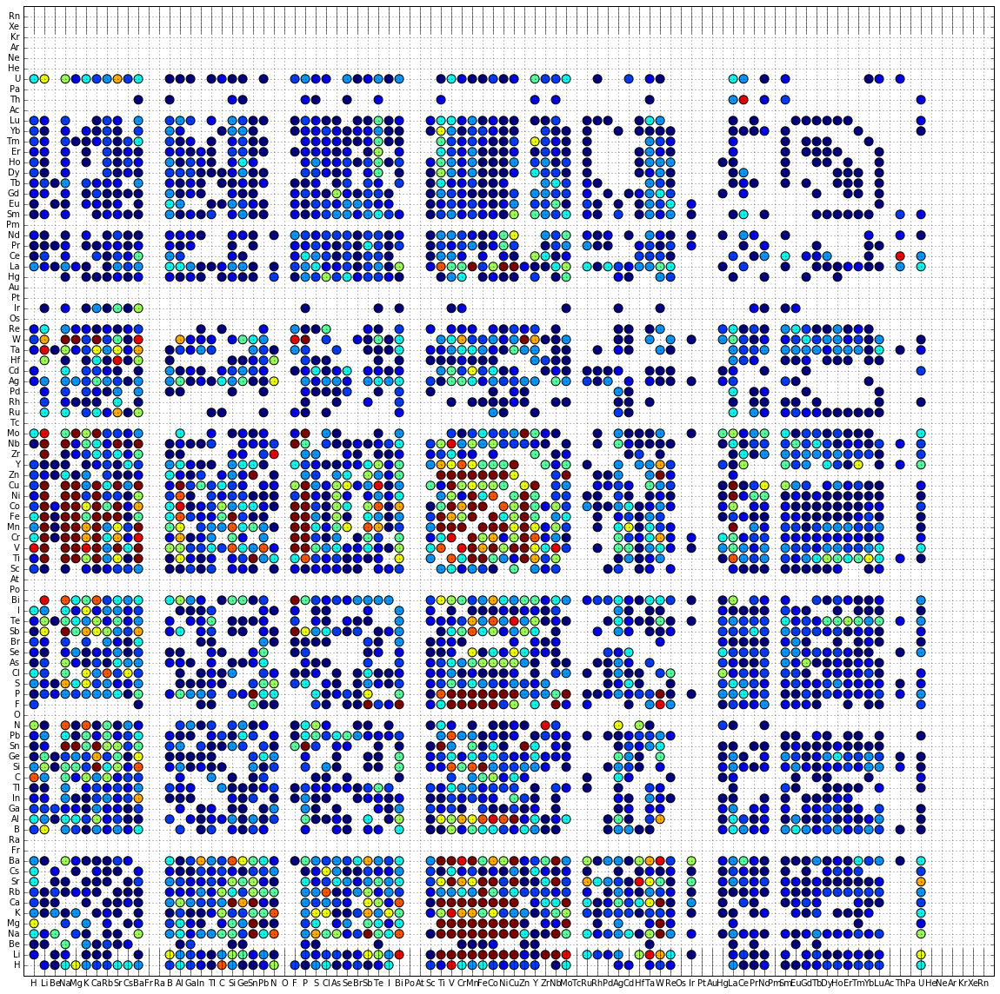

In [424]:
plt.rcParams["xtick.labelsize"]=10 
plt.rcParams["ytick.labelsize"]=10  
plt.figure(figsize=(20,20))
xarr,yarr,dzarr=get_scatterplot_summed_refactored(refactor_summed,8,refactored_Zlist)
 
plt.xlim([-1,len(El_refactored_list)])
plt.ylim([-1,len(El_refactored_list)])
plt.xticks(np.arange(0,len(El_refactored_list)),El_refactored_list)
plt.yticks(np.arange(0,len(El_refactored_list)),El_refactored_list)
plt.clim(1,12)
plt.grid()

In [428]:
def get_scatterplot_refactored_clust_list(ref_array,Z_tag,list_clusts,Zlist):
    count=0
    xarr=np.zeros(8464)
    yarr=np.zeros(8464)
    dzarr=np.zeros(8464)
    clust_arr=np.zeros((8464,4))
    #label_arr=np.zeros(8464)
    Z=Z_tag-1
    refactor_block1=(ref_array[Z])[:,:,list_clusts]
    ref_summed=np.sum(refactor_block1,axis=2)
    for (a,b),d in np.ndenumerate(ref_summed):
        if d>0:
            xarr[count]=Zlist.index(a+1)
            yarr[count]=Zlist.index(b+1)
            dzarr[count]=d
            count=count+1
    xarr=xarr[0:count]
    yarr=yarr[0:count]
    dzarr=dzarr[0:count]
    return (xarr,yarr,zarr,dzarr)

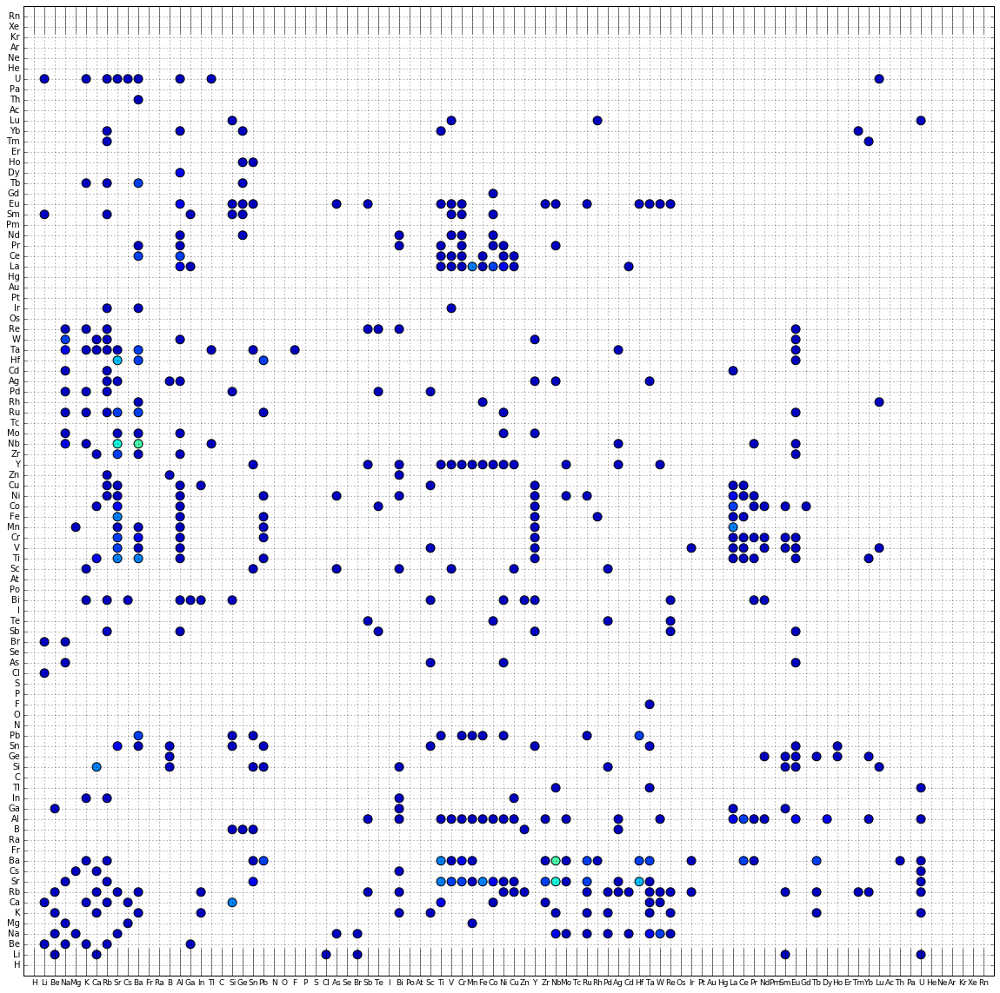

In [435]:
plt.rcParams["xtick.labelsize"]=9 
plt.rcParams["ytick.labelsize"]=10  
plt.figure(figsize=(20,20))
xarr,yarr,zarr,dzarr=get_scatterplot_refactored_clust_list(refactor_array,8,[13],refactored_Zlist)
plt.scatter(xarr,yarr,c=dzarr,s=100)
plt.xlim([-1,len(El_refactored_list)])
plt.ylim([-1,len(El_refactored_list)])
plt.xticks(np.arange(0,len(El_refactored_list)),El_refactored_list)
plt.yticks(np.arange(0,len(El_refactored_list)),El_refactored_list)
plt.grid()
plt.clim(0,16)

### Lets create subplots to show where the oxides in each of the clusters lies after this refactoring. 

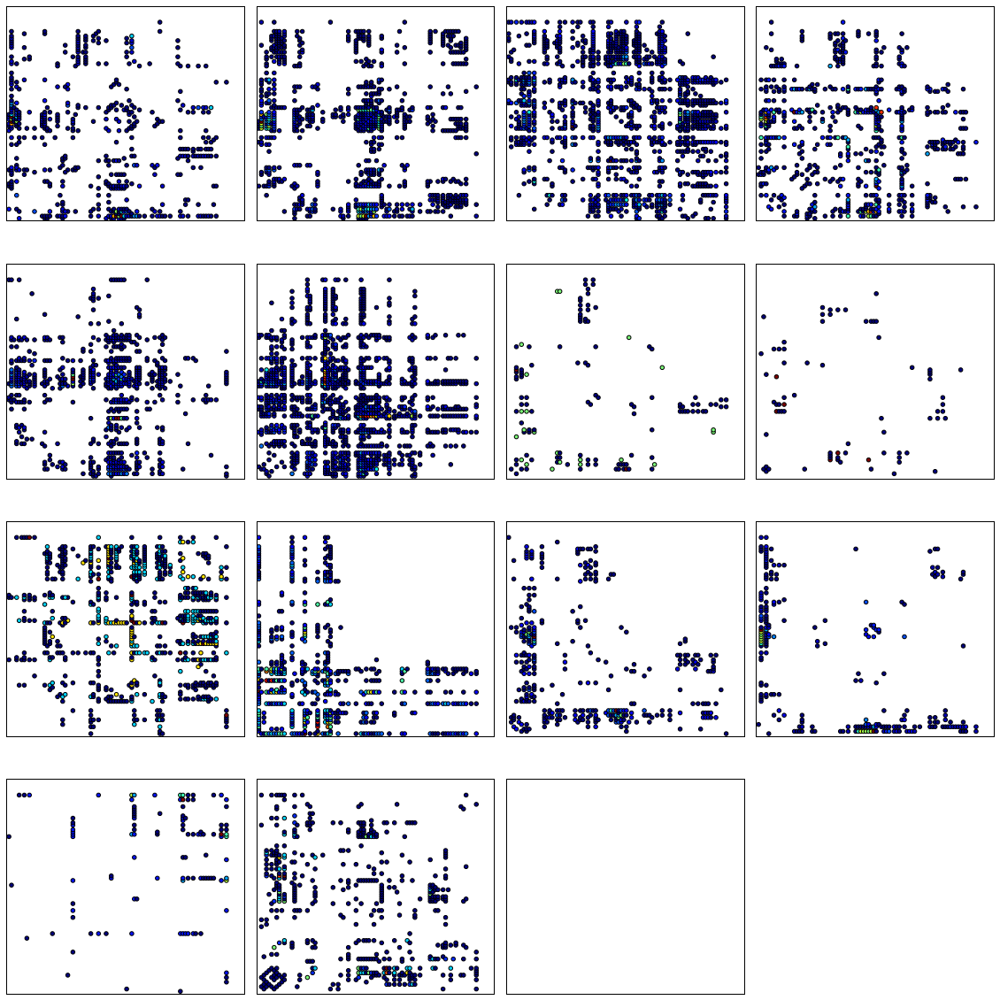

In [434]:
plt.rcParams["xtick.labelsize"]=9 
plt.rcParams["ytick.labelsize"]=10  
plt.figure(figsize=(20,20))

for i in range(15):
    plt.subplot(4,4,i+1)
    xarr,yarr,zarr,dzarr=get_scatterplot_refactored_clust_list(refactor_array,8,[i],refactored_Zlist)
    plt.scatter(xarr,yarr,c=dzarr,s=20)
    plt.xlim([-1,len(El_refactored_list)])
    plt.ylim([-1,len(El_refactored_list)])
    plt.xticks([])
    plt.yticks([])
plt.clim(0,16)
